In [42]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

In [43]:
df = pd.read_csv('./dataset/dataset/train.csv')

In [44]:
df.head()

,ID,TARGET_LifeExpectancy,Country,Year,Status,AdultMortality,AdultMortality-Male,AdultMortality-Female,SLS,Alcohol,...,Polio,TotalExpenditure,Diphtheria,HIV-AIDS,GDP,Population,Thinness1-19years,Thinness5-9years,IncomeCompositionOfResources,Schooling
0,1,67.1,146,2017,0,263,262,264,62,0.01,...,6,8.16,65.0,0.1,654.37,33736494,17.2,17.3,0.479,3.178050
1,2,59.8,146,2016,0,271,278,264,64,0.01,...,58,8.18,62.0,0.1,686.22,327582,17.5,17.5,0.476,3.162278
2,3,57.6,146,2015,0,268,246,290,66,0.01,...,62,8.13,64.0,0.1,707.55,31731688,17.7,17.7,0.470,3.146427
3,4,55.5,146,2014,0,272,248,296,69,0.01,...,67,8.52,67.0,0.1,750.35,3696958,17.9,18.0,0.463,3.130495
4,5,57.7,146,2013,0,275,278,272,71,0.01,...,68,7.87,68.0,0.1,71.16,2978599,18.2,18.2,0.454,3.082207


In [45]:
df.head(20)

,ID,TARGET_LifeExpectancy,Country,Year,Status,AdultMortality,AdultMortality-Male,AdultMortality-Female,SLS,Alcohol,...,Polio,TotalExpenditure,Diphtheria,HIV-AIDS,GDP,Population,Thinness1-19years,Thinness5-9years,IncomeCompositionOfResources,Schooling
0,1,67.1,146,2017,0,263,262,264,62,0.01,...,6,8.16,65.0,0.1,654.37,33736494,17.2,17.3,0.479,3.178050
1,2,59.8,146,2016,0,271,278,264,64,0.01,...,58,8.18,62.0,0.1,686.22,327582,17.5,17.5,0.476,3.162278
2,3,57.6,146,2015,0,268,246,290,66,0.01,...,62,8.13,64.0,0.1,707.55,31731688,17.7,17.7,0.470,3.146427
3,4,55.5,146,2014,0,272,248,296,69,0.01,...,67,8.52,67.0,0.1,750.35,3696958,17.9,18.0,0.463,3.130495
4,5,57.7,146,2013,0,275,278,272,71,0.01,...,68,7.87,68.0,0.1,71.16,2978599,18.2,18.2,0.454,3.082207
5,6,58.9,146,2012,0,279,266,292,74,0.01,...,66,9.20,66.0,0.1,619.73,2883167,18.4,18.4,0.448,3.033150
6,7,57.5,146,2011,0,281,270,292,77,0.01,...,63,9.42,63.0,0.1,499.40,284331,18.6,18.7,0.434,2.983287
7,8,57.0,146,2010,0,287,276,298,80,0.03,...,64,8.33,64.0,0.1,418.16,2729431,18.8,18.9,0.433,2.949576
8,9,63.0,146,2009,0,295,276,314,82,0.02,...,63,6.73,63.0,0.1,414.22,26616792,19.0,19.1,0.415,2.898275
9,10,54.1,146,2008,0,295,304,286,84,0.03,...,58,7.43,58.0,0.1,305.27,2589345,19.2,19.3,0.405,2.846050


## EDA

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2071 entries, 0 to 2070
Data columns (total 24 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   ID                            2071 non-null   int64  
 1   TARGET_LifeExpectancy         2071 non-null   float64
 2   Country                       2071 non-null   int64  
 3   Year                          2071 non-null   int64  
 4   Status                        2071 non-null   int64  
 5   AdultMortality                2071 non-null   int64  
 6   AdultMortality-Male           2071 non-null   int64  
 7   AdultMortality-Female         2071 non-null   int64  
 8   SLS                           2071 non-null   int64  
 9   Alcohol                       2071 non-null   float64
 10  PercentageExpenditure         2071 non-null   float64
 11  Measles                       2071 non-null   int64  
 12  BMI                           2071 non-null   float64
 13  Und

In [47]:
df.describe()

,ID,TARGET_LifeExpectancy,Country,Year,Status,AdultMortality,AdultMortality-Male,AdultMortality-Female,SLS,Alcohol,...,Polio,TotalExpenditure,Diphtheria,HIV-AIDS,GDP,Population,Thinness1-19years,Thinness5-9years,IncomeCompositionOfResources,Schooling
count,2071.000000,2071.000000,2071.000000,2071.000000,2071.000000,2071.000000,2071.000000,2071.000000,2071.000000,2071.000000,...,2071.000000,2071.000000,2071.000000,2071.000000,2071.000000,2.071000e+03,2071.000000,2071.000000,2071.000000,2071.000000
mean,1036.000000,69.274505,95.360212,2009.518590,0.185418,162.833897,161.908257,163.759536,33.079672,4.696379,...,82.727185,5.883858,82.753259,1.632883,7352.742342,1.203741e+07,4.941284,4.977306,0.609551,3.372453
std,597.990524,9.482281,54.861641,4.614147,0.388730,118.872170,119.442235,118.800292,135.832868,4.205888,...,23.188837,2.554965,23.130969,4.782325,15219.978663,6.391797e+07,4.697830,4.785532,0.216532,0.590832
min,1.000000,37.300000,0.000000,2002.000000,0.000000,1.000000,0.000000,2.000000,0.000000,0.010000,...,3.000000,0.370000,2.000000,0.100000,1.880000,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,518.500000,63.000000,50.000000,2006.000000,0.000000,74.000000,74.000000,74.000000,0.000000,0.615000,...,77.000000,4.190000,78.000000,0.100000,413.730000,1.274450e+05,1.600000,1.500000,0.463000,3.065942
50%,1036.000000,71.200000,94.000000,2010.000000,0.000000,144.000000,142.000000,144.000000,3.000000,3.830000,...,93.000000,5.640000,93.000000,0.100000,1410.670000,6.522310e+05,3.200000,3.300000,0.655000,3.449638
75%,1553.500000,76.000000,144.000000,2014.000000,0.000000,228.000000,228.000000,230.000000,22.000000,7.840000,...,97.000000,7.430000,97.000000,0.800000,5811.295000,5.371104e+06,7.400000,7.400000,0.769500,3.741657
max,2071.000000,92.700000,192.000000,2017.000000,1.000000,699.000000,704.000000,722.000000,1800.000000,17.870000,...,99.000000,17.600000,99.000000,50.600000,133473.470000,1.293859e+09,27.700000,28.600000,0.948000,4.381780


In [48]:
numerical_cols = ['AdultMortality', 'AdultMortality-Female', 'AdultMortality-Male', 'SLS', 'Alcohol', 'PercentageExpenditure', 'Measles', 'BMI', 'Under5LS', 'Polio', 'TotalExpenditure', 'Diphtheria', 'HIV-AIDS', 'GDP', 'Population', 'Thinness1-19years','IncomeCompositionOfResources' ,'Thinness5-9years', 'Schooling' ]
categorical_cols = ['Country', 'Year', 'Status']
target = 'TARGET_LifeExpectancy'

<Axes: xlabel='TARGET_LifeExpectancy', ylabel='Status'>

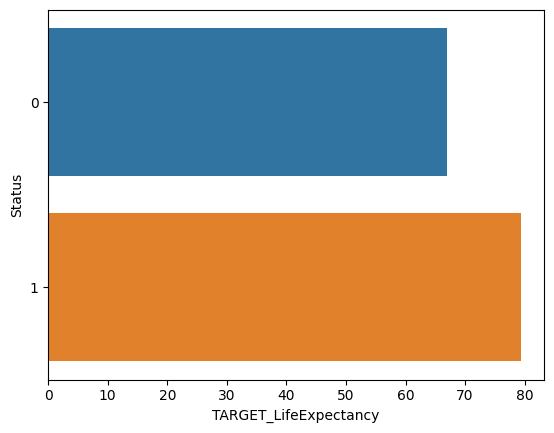

In [49]:
group_by = df.groupby('Status').mean().reset_index()
group_by
sns.barplot(x=group_by[target], y=group_by['Status'], orient='h')

<Axes: xlabel='TARGET_LifeExpectancy', ylabel='Year'>

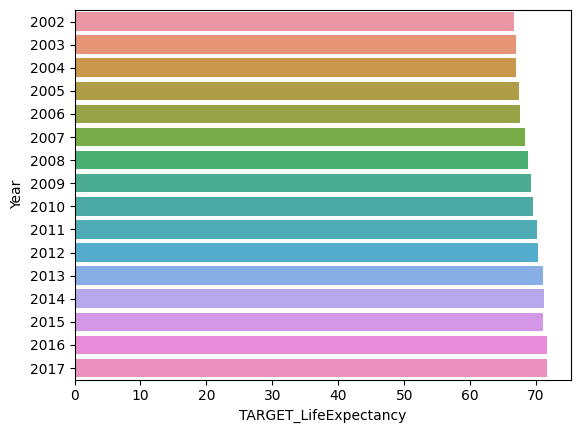

In [50]:
group_by = df.groupby('Year').mean().reset_index()
group_by
sns.barplot(x=group_by[target], y=group_by['Year'], orient='h')

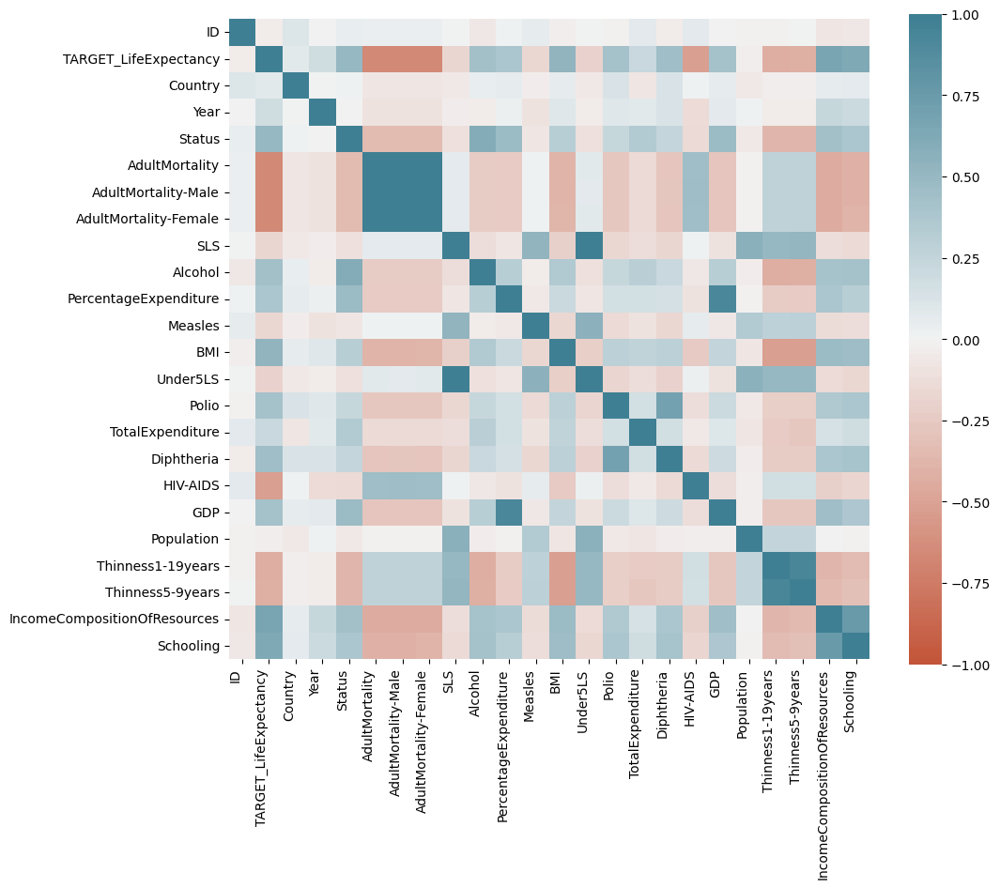

In [51]:
f, ax = plt.subplots(figsize=(11, 9))
corr = df.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
);

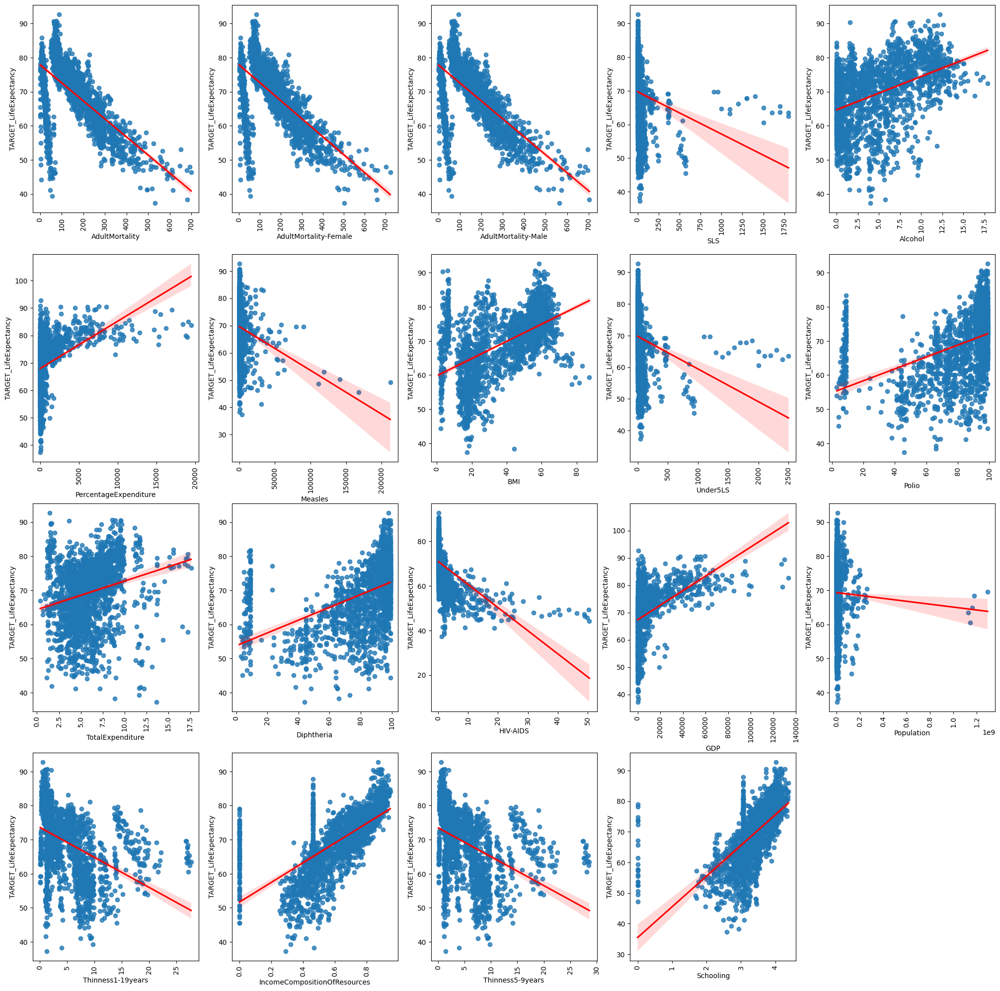

In [41]:
plt.figure(figsize=(25, 25))

for i, col in enumerate(numerical_cols):
    plt.subplot(4, 5, i + 1)
    sns.regplot(data=df, x=df[col], y=df['TARGET_LifeExpectancy'], line_kws=dict(color='r') , logx=False)
    # plt.title(col)
    plt.xticks(rotation='vertical')

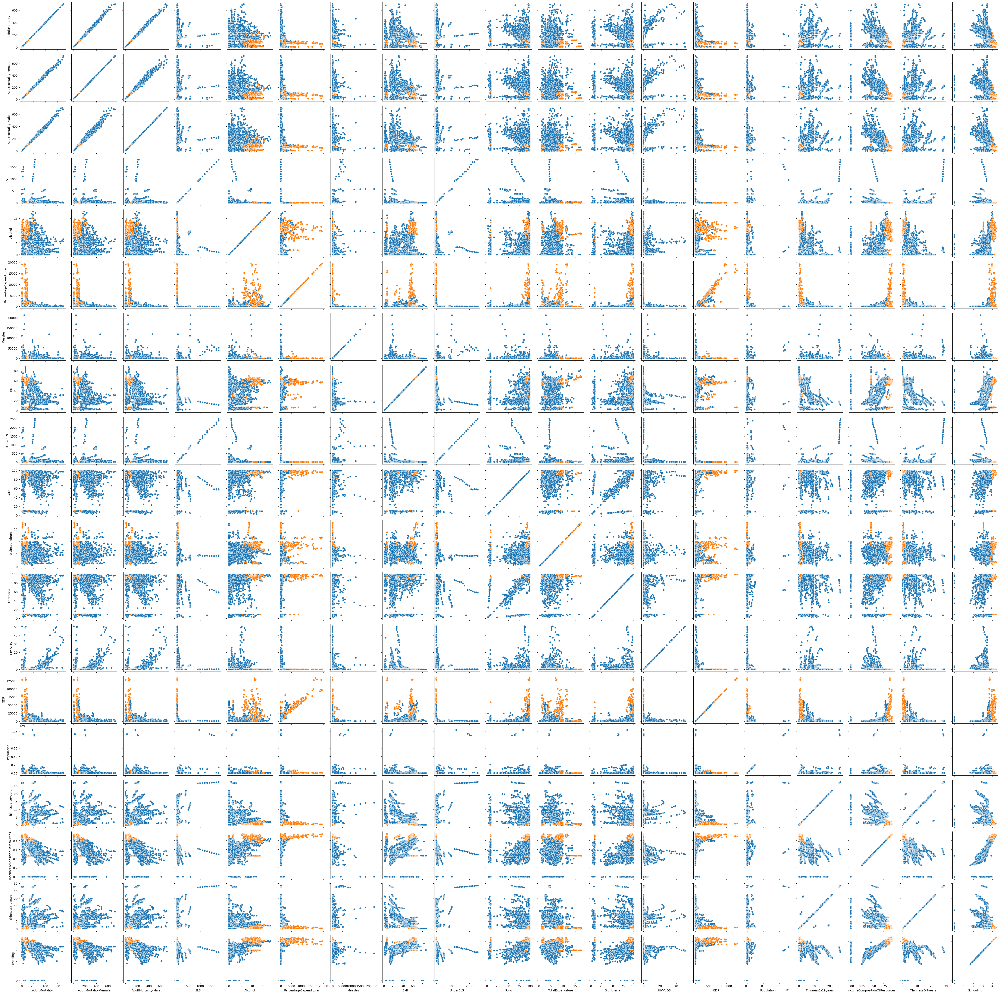

In [10]:
import seaborn as sns

g = sns.PairGrid(df, vars=numerical_cols, hue="Status")
g.map(sns.scatterplot)
plt.show()

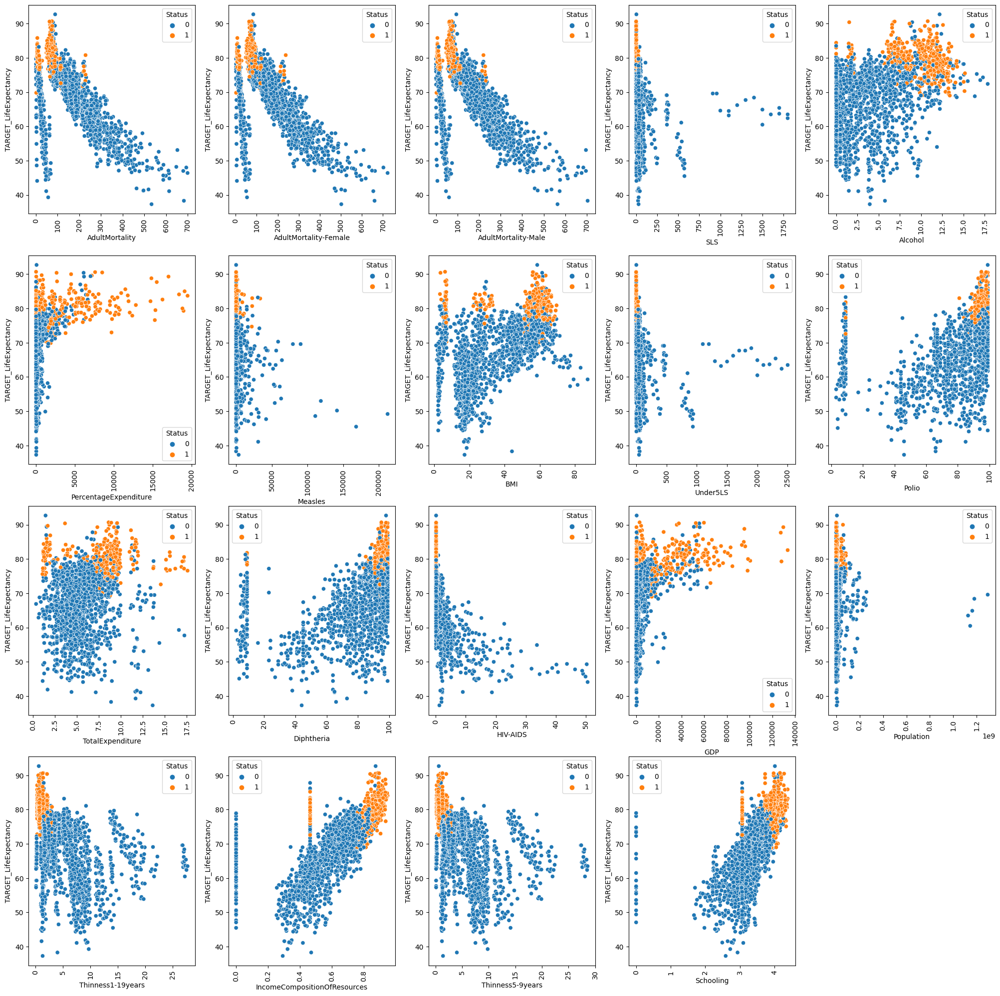

In [11]:
plt.figure(figsize=(25, 25))

for i, col in enumerate(numerical_cols):
    plt.subplot(4, 5, i + 1)
    sns.scatterplot(data=df, x=df[col], y=df['TARGET_LifeExpectancy'], hue='Status', )
    # plt.title(col)
    plt.xticks(rotation='vertical')

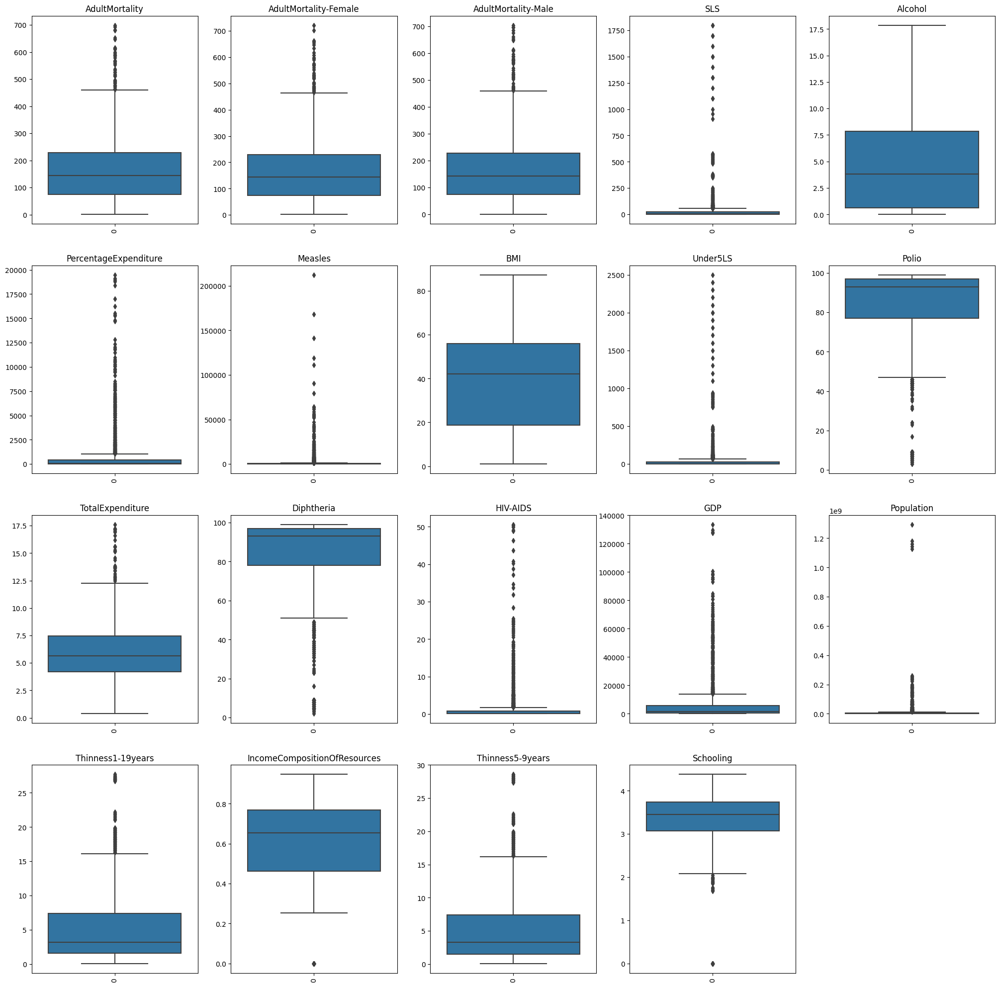

In [12]:
plt.figure(figsize=(25, 25))

for i, col in enumerate(numerical_cols):
    plt.subplot(4, 5, i + 1)
    sns.boxplot(df[col])
    plt.title(col)
    plt.xticks(rotation='vertical')

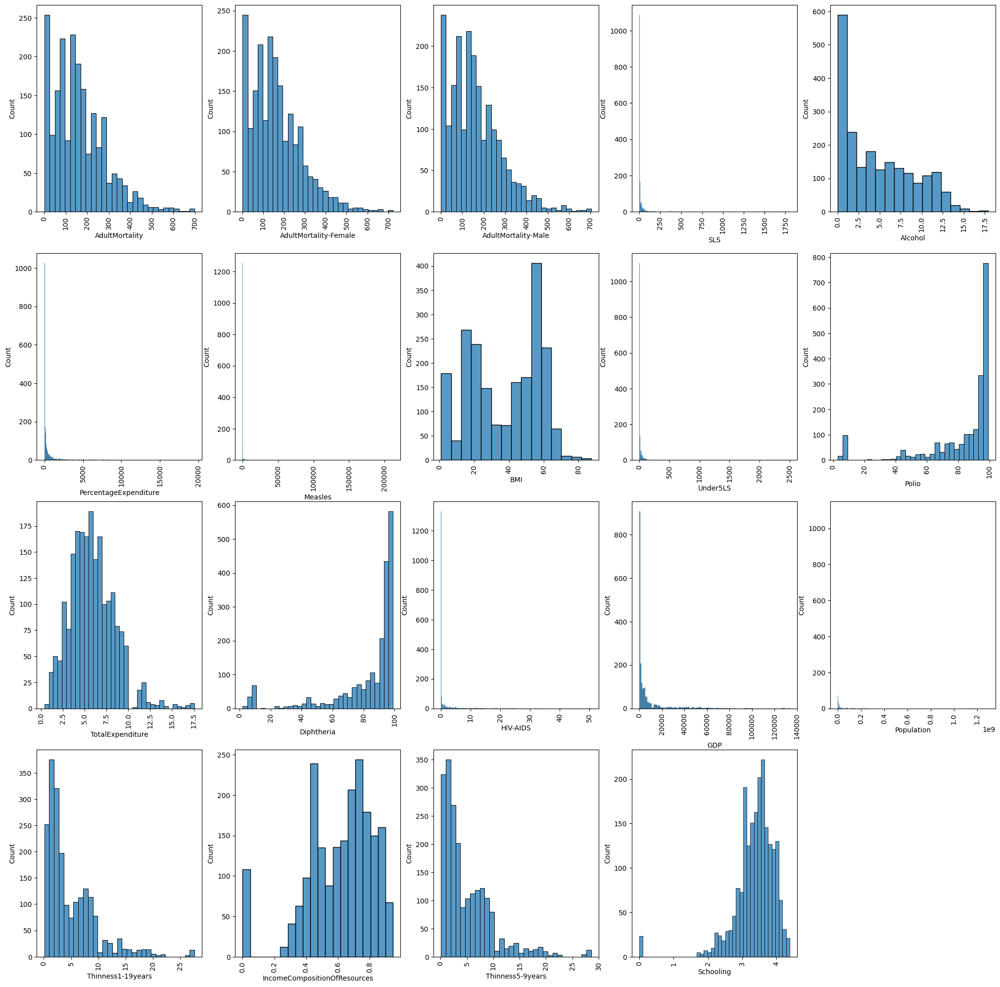

In [13]:
def histogram(data):
    plt.figure(figsize=(25, 25))

    for i, col in enumerate(numerical_cols):
        plt.subplot(4, 5, i + 1)
        sns.histplot(data[col])
        # plt.title(col)
        plt.xticks(rotation='vertical')
histogram(df)

This shows that Status column may be correlated to the target. But let's inspect if there is an imbalance in the dataset

As it can be seen, there are less samples of 1 - developing countries than 0 - developed countries

## Data splitting

In [14]:
df_X = df.drop(columns=[target])
df_y = df[target]

X_train, X_test, y_train, y_test = train_test_split(df_X, df_y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

## Baseline model

In [15]:
from sklearn.linear_model import LinearRegression
baseline_model = LinearRegression()
baseline_model.fit(X_train, y_train)
y_pred = baseline_model.predict(X_val)

In [16]:
baseline_model.coef_

array([ 1.29702753e-04,  4.60498530e-03,  5.15465437e-02,  2.14970818e+00,
       -6.72987019e-03, -1.05856438e-02, -2.87409657e-03,  9.77738936e-02,
        2.09615343e-01, -7.69147581e-05, -1.50657890e-07,  3.03014671e-02,
       -7.25593954e-02,  1.12327147e-02, -6.59190923e-02,  4.23997237e-02,
       -4.76370608e-01,  5.69303424e-05, -3.03212873e-09, -8.29408807e-02,
       -3.97794113e-02,  7.02157161e+00,  1.98964323e+00])

### Baseline model evaluation

In [17]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
# Calculate r2 score
r2_s = r2_score(y_val, y_pred=y_pred)
mae = mean_absolute_error(y_val, y_pred)
mse = mean_squared_error(y_val, y_pred)

print("R2 Score: " + str(r2_s))
print("MAE Score: " + str(mae))
print("MSE Score: " + str(mse))

R2 Score: 0.7438924830712975
MAE Score: 3.6239646017035385
MSE Score: 23.08018182230433


## Data transformation

### Encoding categorical data

In [18]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoder.fit(df[['Country']])
encoded_cols = list(encoder.get_feature_names_out(['Country']))
print(encoded_cols)
X_train[encoded_cols] = encoder.transform(X_train[['Country']])

['Country_0', 'Country_2', 'Country_4', 'Country_5', 'Country_6', 'Country_9', 'Country_11', 'Country_13', 'Country_14', 'Country_15', 'Country_18', 'Country_19', 'Country_21', 'Country_23', 'Country_24', 'Country_25', 'Country_26', 'Country_27', 'Country_28', 'Country_29', 'Country_30', 'Country_31', 'Country_33', 'Country_34', 'Country_36', 'Country_37', 'Country_39', 'Country_42', 'Country_43', 'Country_44', 'Country_46', 'Country_47', 'Country_48', 'Country_50', 'Country_51', 'Country_53', 'Country_54', 'Country_55', 'Country_57', 'Country_58', 'Country_59', 'Country_60', 'Country_61', 'Country_62', 'Country_64', 'Country_65', 'Country_66', 'Country_67', 'Country_68', 'Country_69', 'Country_70', 'Country_71', 'Country_72', 'Country_73', 'Country_74', 'Country_75', 'Country_77', 'Country_79', 'Country_80', 'Country_83', 'Country_84', 'Country_85', 'Country_86', 'Country_88', 'Country_90', 'Country_91', 'Country_92', 'Country_93', 'Country_94', 'Country_95', 'Country_96', 'Country_97

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_25468\2243384756.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train[encoded_cols] = encoder.transform(X_train[['Country']])
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_25468\2243384756.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_train[encoded_cols] = encoder.transform(X_train[['Country']])
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_25468\2243384756.py:7: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many

In [19]:
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
encoder.fit(df[['Country']])
encoded_cols = list(encoder.get_feature_names_out(['Country']))
print(encoded_cols)
X_test[encoded_cols] = encoder.transform(X_test[['Country']])

['Country_0', 'Country_2', 'Country_4', 'Country_5', 'Country_6', 'Country_9', 'Country_11', 'Country_13', 'Country_14', 'Country_15', 'Country_18', 'Country_19', 'Country_21', 'Country_23', 'Country_24', 'Country_25', 'Country_26', 'Country_27', 'Country_28', 'Country_29', 'Country_30', 'Country_31', 'Country_33', 'Country_34', 'Country_36', 'Country_37', 'Country_39', 'Country_42', 'Country_43', 'Country_44', 'Country_46', 'Country_47', 'Country_48', 'Country_50', 'Country_51', 'Country_53', 'Country_54', 'Country_55', 'Country_57', 'Country_58', 'Country_59', 'Country_60', 'Country_61', 'Country_62', 'Country_64', 'Country_65', 'Country_66', 'Country_67', 'Country_68', 'Country_69', 'Country_70', 'Country_71', 'Country_72', 'Country_73', 'Country_74', 'Country_75', 'Country_77', 'Country_79', 'Country_80', 'Country_83', 'Country_84', 'Country_85', 'Country_86', 'Country_88', 'Country_90', 'Country_91', 'Country_92', 'Country_93', 'Country_94', 'Country_95', 'Country_96', 'Country_97

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_25468\2317259260.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_test[encoded_cols] = encoder.transform(X_test[['Country']])
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_25468\2317259260.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X_test[encoded_cols] = encoder.transform(X_test[['Country']])
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_25468\2317259260.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many tim

### Transform numeric

In [20]:
numeric_transform_cols = ['AdultMortality','AdultMortality-Female', 'AdultMortality-Male', 'Alcohol', 'BMI', 'IncomeCompositionOfResources','Schooling' ]

In [21]:
from sklearn.preprocessing import PowerTransformer
for i, col in enumerate(numeric_transform_cols):
    transformer = PowerTransformer(method='yeo-johnson', standardize=False).fit(X_train[[col]])
    X_train[col] = transformer.transform(X_train[[col]])
    transformer = PowerTransformer(method='yeo-johnson', standardize=False).fit(X_test[[col]])
    X_test[col] = transformer.transform(X_test[[col]])

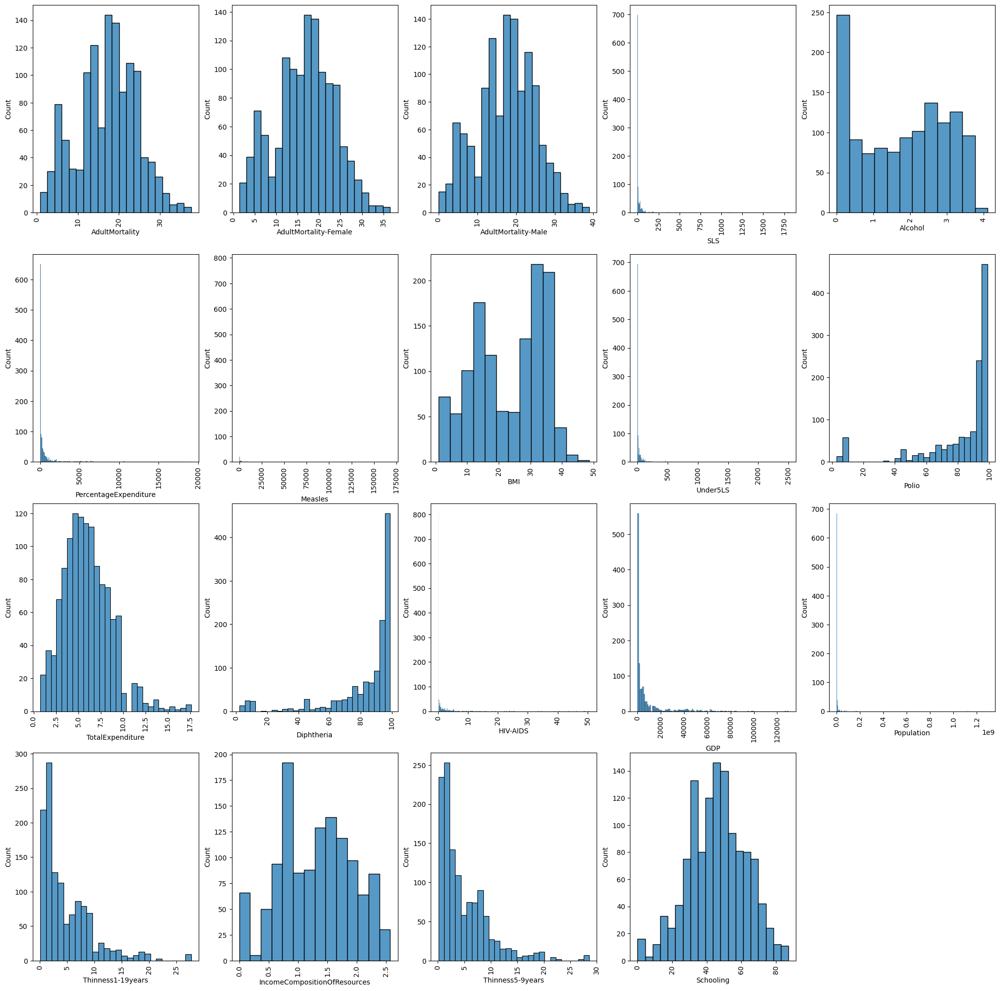

In [26]:
histogram(X_train)

In [27]:
len(y_train)

1242

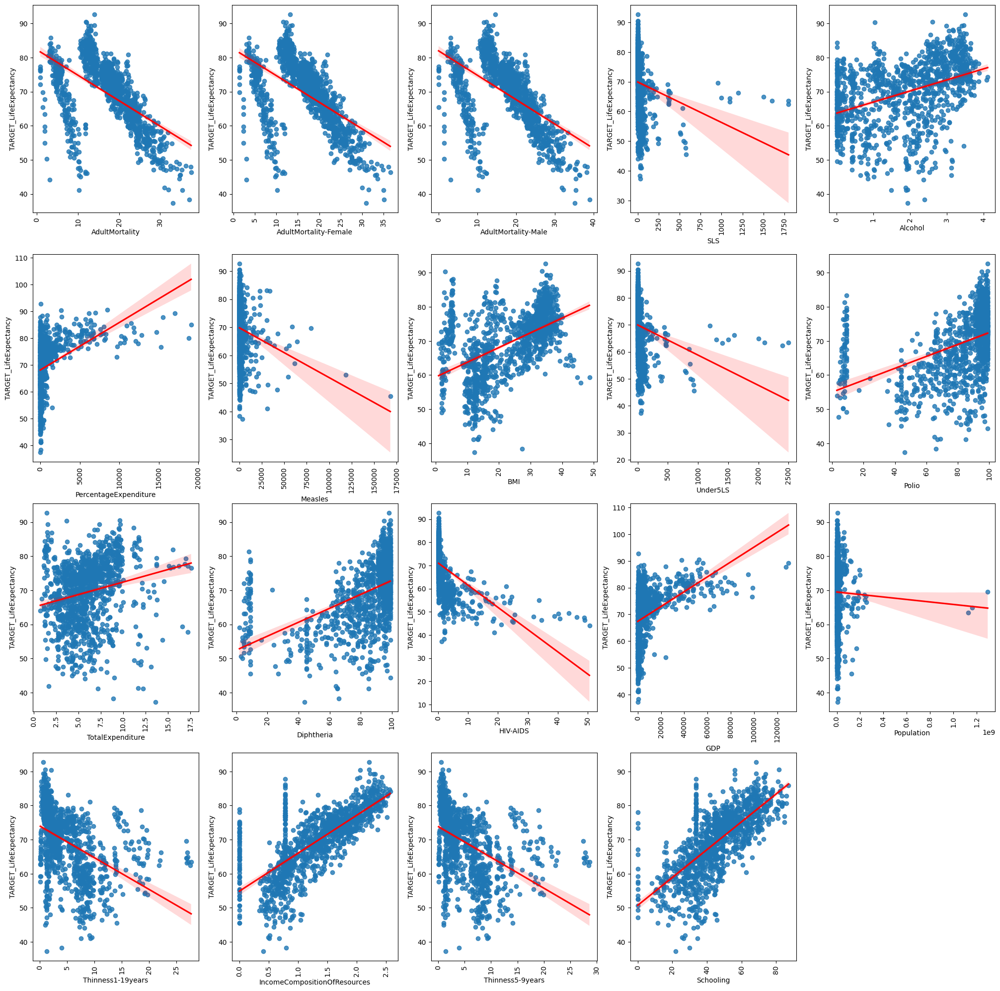

In [28]:
plt.figure(figsize=(25, 25))

for i, col in enumerate(numerical_cols):
    plt.subplot(4, 5, i + 1)
    sns.regplot(x=X_train[col], y=y_train, line_kws=dict(color='r') , logx=False)
    # plt.title(col)
    plt.xticks(rotation='vertical')


### Scaler

In [29]:
from sklearn.preprocessing import RobustScaler


In [30]:
scaler = RobustScaler()
scaler.fit(df[numerical_cols])
X_train[numerical_cols] = scaler.transform(X_train[numerical_cols])
X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])

In [31]:
X_test

,ID,Country,Year,Status,AdultMortality,AdultMortality-Male,AdultMortality-Female,SLS,Alcohol,PercentageExpenditure,...,Country_178,Country_179,Country_182,Country_183,Country_184,Country_185,Country_186,Country_187,Country_188,Country_192
907,908,50,2007,1,-0.846736,-0.833587,-0.836404,-0.136364,-0.054046,2.131917,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1709,1710,108,2010,1,-0.912746,-0.901884,-0.899137,-0.045455,-0.107564,13.026100,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2003,2004,112,2005,0,-0.803026,-0.792427,-0.791135,-0.136364,-0.412600,-0.098322,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
170,171,176,2007,0,-0.776230,-0.762240,-0.768135,-0.090909,-0.093117,-0.055074,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
321,322,95,2016,0,-0.763020,-0.743791,-0.760516,0.863636,-0.528725,-0.065440,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339,340,28,2014,0,-0.824602,-0.813720,-0.812545,-0.136364,-0.528725,-0.083568,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
442,443,151,2007,1,-0.826926,-0.810929,-0.819834,-0.136364,-0.082725,0.231445,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
274,275,185,2015,0,-0.843303,-0.830145,-0.833047,-0.136364,-0.528725,6.542575,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2006,2007,112,2002,0,-0.895299,-0.884912,-0.881525,-0.136364,-0.411873,-0.111042,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Model creation

In [32]:
# Base line model linear regression
from sklearn.linear_model import Ridge, Lasso
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
model.score(X_test, y_test)

ridge_model = Ridge()
ridge_model.fit(X_train, y_train)
ridge_model.score(X_test, y_test)

0.8638080523541736

In [33]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_pred=y_pred, y_true=y_test)

8.91052853213624

## Pipeline

In [34]:
from sklearn.pipeline import Pipeline

In [35]:
p1 = Pipeline([''])